In [13]:
import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt
import IPython.display as Ipd
import os

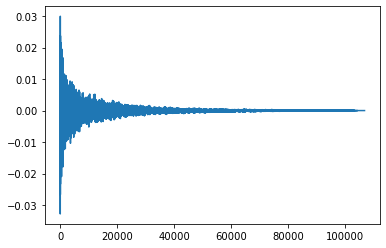

In [15]:
filenames = os.listdir('data/sounds')
sr = 22050

for i in range(len(filenames)):
    if(filenames[i].startswith("cymbal")):
        signal, dummy = librosa.load('data/sounds/' + filenames[i], sr, mono=True)
        plt.plot(signal)        
        break
        
irFilenames = os.listdir('data/sounds/wav_database/subject3')
for i in range(len(filenames)):
    if(filenames[i].startswith("cymbal")):
        signal, dummy = librosa.load('data/sounds/' + filenames[i], sr, mono=True)
        plt.plot(signal)        
        break

Ipd.Audio(signal, rate=sr)

In [17]:
import scipy.io
mat = scipy.io.loadmat('data/CIPIC_hrtf_database/standard_hrir_database/subject_003/hrir_final.mat')
mat

{'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNX86, Created on: Mon Aug 13 20:10:07 2001',
 '__version__': '1.0',
 '__globals__': [],
 'OnR': array([[51.25 , 51.25 , 51.125, ..., 49.5  , 49.375, 49.625],
        [48.625, 48.625, 48.625, ..., 48.5  , 48.5  , 48.625],
        [45.5  , 45.625, 45.875, ..., 46.25 , 46.25 , 46.25 ],
        ...,
        [26.5  , 26.5  , 26.5  , ..., 27.375, 27.375, 27.25 ],
        [25.375, 25.375, 25.25 , ..., 26.   , 26.   , 26.   ],
        [22.125, 22.   , 22.   , ..., 22.5  , 22.5  , 22.5  ]]),
 'OnL': array([[22.125, 22.125, 22.125, ..., 22.375, 22.375, 22.375],
        [24.75 , 24.625, 24.625, ..., 25.5  , 25.5  , 25.5  ],
        [25.25 , 25.25 , 25.25 , ..., 26.125, 26.125, 25.875],
        ...,
        [47.25 , 47.25 , 47.125, ..., 48.   , 47.875, 47.875],
        [50.   , 49.75 , 49.625, ..., 49.5  , 49.375, 49.5  ],
        [51.375, 51.25 , 51.125, ..., 50.   , 50.125, 50.125]]),
 'ITD': array([[29.125, 29.125, 29.   , ..., 27.125, 27.   , 2

In [84]:
#y = -45 +5.625*x
el_c = (180 + 45)/5.625
el_c

40.0

In [ ]:
import soundfile as sf
r = np.array(mat['hrir_r'])
l = np.array(mat['hrir_l'])
print(r.shape)
#plt.plot(r[12,25,:])
az = 18 #0, 8, 13, 18, 24
el = 8 # 8 40 24 49
test_r = r[az,el,:]
test_l = l[az,el, :]
x_r = np.convolve(signal, test_r)
x_l = np.convolve(signal, test_l)
plt.subplot(2,1,1)
plt.plot(x_r)
plt.subplot(2,1,2)
plt.plot(x_l)
x = np.array([x_l, x_r])
print(x.shape)

sf.write('data/processed/output.wav', x.transpose(), sr)
Ipd.Audio(x, rate=sr)


# TEST SELD DATA

In [66]:
import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt
import IPython.display as Ipd
import os

# filenames = os.listdir('data/sounds')
# sr = 22050

# for i in range(len(filenames)):
#     if(filenames[i].startswith("cymbal")):
#         signal, dummy = librosa.load('data/sounds/' + filenames[i], sr, mono=True)
#         plt.plot(signal)        
#         break
        
# irFilenames = os.listdir('data/sounds/wav_database/subject3')
# for i in range(len(filenames)):
#     if(filenames[i].startswith("cymbal")):
#         signal, dummy = librosa.load('data/sounds/' + filenames[i], sr, mono=True)
#         plt.plot(signal)        
#         break

# Ipd.Audio(signal, rate=sr)
sr = 22050
signal, sr = librosa.load('data/dcase_data/foa_dev/split1_ir0_ov1_1.wav', sr, mono=False)


In [2]:
print(signal.shape)
Ipd.Audio(signal, rate=sr)

(4, 1295452)


In [65]:
# start_time = 49.381274112
# end_time = 50.081274112
import soundfile as sf
start_time = 5.34
end_time = 7.12

s = int(start_time * sr)
e = int(end_time * sr)

sample = signal[:, s:e]

#plt.plot(sample[1,:])

print(sample.shape)

import spaudiopy as spa


#Ipd.Audio(sample, rate=sr)
print(type(sample))

#amb = spa.sig.AmbiBSignal(sample.tolist(), sr)
amb = spa.process.ambeo_a2b(spa.sig.MultiSignal(sample.tolist(), sr), filter_coeffs=None)

x = spa.process.b_to_stereo(amb)
xnp = np.array(x)
print(xnp.shape)


sf.write('output/output.wav', xnp.transpose(), sr) 
Ipd.Audio(xnp, rate=sr)

(4, 39249)
<class 'numpy.ndarray'>
(2, 39249)


AttributeError: module 'IPython.display' has no attribute 'Display'

In [17]:
d = sample.tolist()
print(len(d[3]))

39249


In [64]:
import pandas as pd
filenames = os.listdir('data/dcase_data/metadata_dev') #Development
#filenames = os.listdir('data/dcase_data/testing/metadata_eval') #Development
#split1_ir0_ov1_1.csv

dic_label_counters = {}

c = 0
for i in range(len(filenames)):
    metadata = pd.read_csv('data/dcase_data/metadata_dev/' + filenames[i])  #Development
    #metadata = pd.read_csv('data/dcase_data/testing/metadata_eval/' + filenames[i])  #testing
    counts = metadata['sound_event_recording'].value_counts()
    for index, value in counts.items():
        if index not in dic_label_counters:
            dic_label_counters[index] = value
        else:
            dic_label_counters[index] += value
#     c +=1
#     print(counts)
#     if c == 3:
#         break
print(dic_label_counters)

{'cough': 337, 'keysDrop': 356, 'phone': 382, 'keyboard': 366, 'knock': 376, 'clearthroat': 358, 'doorslam': 359, 'drawer': 363, 'laughter': 367, 'speech': 350, 'pageturn': 360}


In [67]:
import soundfile as sf
start_time = 5.34
end_time = 7.12

s = int(start_time * sr)
e = int(end_time * sr)

sample = signal[:, s:e]

In [69]:
import numpy as np
import pandas as pd
import scipy
import librosa, librosa.display
import matplotlib.pyplot as plt
import matplotlib.style as ms
#ms.use('seaborn-muted')
import IPython.display as Ipd
import os
import sklearn


In [139]:
# from synthetic_tests_lib import crosscorr

# from scipy.fft import fft, ifft
# def cross_correlation_using_fft(x, y):
#     f1 = fft(x)
#     f2 = fft(np.flipud(y))
#     cc = np.real(ifft(f1 * f2))
#     return fftshift(cc)

# def compute_shift(x, y):
#     assert len(x) == len(y)
#     c = cross_correlation_using_fft(x, y)
#     assert len(c) == len(x)
#     zero_index = int(len(x) / 2) - 1
#     shift = zero_index - np.argmax(c)
#     return shift

import scipy as sc

start_time = 5.34#16.3#5.34
end_time = 7.12#19.5#7.12

s = int(start_time * sr)
e = int(end_time * sr)

sample = signal[:, s:e]

feature = []
for i in range(sample.shape[0] - 1):
    for j in range(i + 1, sample.shape[0]):
        cross = sc.signal.correlate(sample[i], sample[j], mode ='full')
        feature.append(np.abs(np.argmax(cross)-len(cross)/2))
        print(feature[len(feature) - 1])

#msp = librosa.feature.melspectrogram(signal[0], n_mels=15)
#print(msp.shape)#2531
#2590903
#1295451
print(feature)

cross = sc.signal.correlate(sample[2], sample[3], mode ='full')
print(np.abs(np.argmax(cross)-len(cross)/2))

61.5
56.5
61.5
113.5
0.5
6.5
[61.5, 56.5, 61.5, 113.5, 0.5, 6.5]
6.5


In [97]:
print(sample.shape)

(4, 39249)


[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

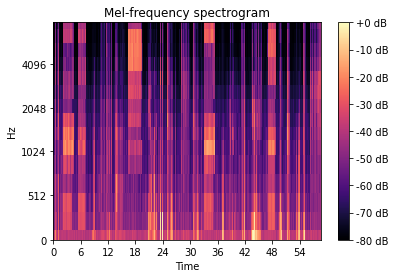

In [83]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(msp, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

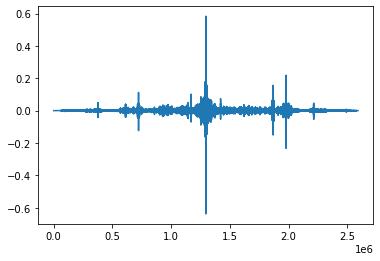

In [98]:
plt.plot(cross)

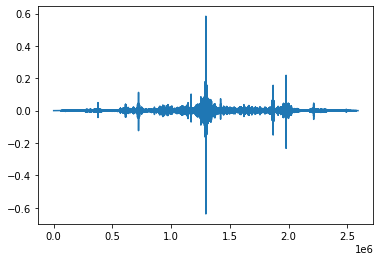

In [101]:
plt.plot(cross2)

In [85]:
output = msp.flatten()
print(output.shape)

(37965,)
